In [84]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/predicta-1-0-predict-the-unpredictable/submission_key.csv
/kaggle/input/predicta-1-0-predict-the-unpredictable/sample_submission.csv
/kaggle/input/predicta-1-0-predict-the-unpredictable/historical_weather.csv


In [85]:
# imporing the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [86]:
# set the display option to show up t0 100 rows
pd.set_option('display.max_rows',100)

In [87]:
# importing the dataset
weather = pd.read_csv('/kaggle/input/predicta-1-0-predict-the-unpredictable/historical_weather.csv')
submission = pd.read_csv('/kaggle/input/predicta-1-0-predict-the-unpredictable/submission_key.csv')

print(weather[:10])
print(submission[:5])

  city_id        date  avg_temp_c  min_temp_c  max_temp_c  precipitation_mm  \
0    C001  2014-01-01         6.6        -1.4        11.6               NaN   
1    C001  2014-01-02         9.3         6.3        13.3               NaN   
2    C001  2014-01-03         7.6         1.9        14.0               NaN   
3    C001  2014-01-04         7.6         3.9        13.3               NaN   
4    C001  2014-01-05         8.6         0.5        16.9               NaN   
5    C001  2014-01-06         9.1         5.7        14.7               NaN   
6    C001  2014-01-07         8.8         2.0        18.8               NaN   
7    C001  2014-01-08         8.8         3.0        16.3               NaN   
8    C001  2014-01-09         9.9         3.9        17.1               NaN   
9    C001  2014-01-10        10.8         7.0        17.2               NaN   

   snow_depth_mm  avg_wind_dir_deg  avg_wind_speed_kmh  
0            NaN             168.0                 6.2  
1            NaN

In [88]:
# dataset info
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 182338 entries, 0 to 182337
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   city_id             182338 non-null  object 
 1   date                182338 non-null  object 
 2   avg_temp_c          181114 non-null  float64
 3   min_temp_c          176452 non-null  float64
 4   max_temp_c          174845 non-null  float64
 5   precipitation_mm    112594 non-null  float64
 6   snow_depth_mm       12238 non-null   float64
 7   avg_wind_dir_deg    146944 non-null  float64
 8   avg_wind_speed_kmh  159866 non-null  float64
dtypes: float64(7), object(2)
memory usage: 12.5+ MB


In [89]:
# converting the date columns to datetime
weather['date'] = pd.to_datetime(weather['date'])

weather['day'] = weather['date'].dt.day
weather['month'] = weather['date'].dt.month
weather['year'] = weather['date'].dt.year

weather = weather.drop('date', axis=1)
weather[:10]

,city_id,avg_temp_c,min_temp_c,max_temp_c,precipitation_mm,snow_depth_mm,avg_wind_dir_deg,avg_wind_speed_kmh,day,month,year
0,C001,6.6,-1.4,11.6,NaN,NaN,168.0,6.2,1,1,2014
1,C001,9.3,6.3,13.3,NaN,NaN,155.0,10.0,2,1,2014
2,C001,7.6,1.9,14.0,NaN,NaN,NaN,5.8,3,1,2014
3,C001,7.6,3.9,13.3,NaN,NaN,291.0,11.3,4,1,2014
4,C001,8.6,0.5,16.9,NaN,NaN,NaN,5.0,5,1,2014
5,C001,9.1,5.7,14.7,NaN,NaN,156.0,5.7,6,1,2014
6,C001,8.8,2.0,18.8,NaN,NaN,158.0,6.2,7,1,2014
7,C001,8.8,3.0,16.3,NaN,NaN,NaN,NaN,8,1,2014
8,C001,9.9,3.9,17.1,NaN,NaN,NaN,4.8,9,1,2014
9,C001,10.8,7.0,17.2,NaN,NaN,149.0,5.8,10,1,2014


In [90]:
# analyzing the dataset
def df_analyze(dataframe):
    df = pd.DataFrame()
    cl=[]; u=[]; s=[]; nans=[]
    
    for col in dataframe.columns:
        cl.append(col); u.append(dataframe[col].unique()); s.append(dataframe[col].unique().size); nans.append(dataframe[col].isnull().sum()) 
        
    df['Columns']=cl; df['Uniques']=u; df['Cardinality']=s; df['NaNs']=nans;

    return df

df_info = df_analyze(weather)

# df_info.sort_values('NaNs', ascending=False)
df_info

,Columns,Uniques,Cardinality,NaNs
0,city_id,"[C001, C002, C003, C004, C005, C007, C008, C00...",100,0
1,avg_temp_c,"[6.6, 9.3, 7.6, 8.6, 9.1, 8.8, 9.9, 10.8, 10.2...",693,1224
2,min_temp_c,"[-1.4, 6.3, 1.9, 3.9, 0.5, 5.7, 2.0, 3.0, 7.0,...",721,5886
3,max_temp_c,"[11.6, 13.3, 14.0, 16.9, 14.7, 18.8, 16.3, 17....",706,7493
4,precipitation_mm,"[nan, 0.0, 10.0, 0.5, 5.8, 0.3, 2.1, 0.1, 0.2,...",860,69744
5,snow_depth_mm,"[nan, 170.0, 110.0, 100.0, 30.0, 160.0, 140.0,...",408,170100
6,avg_wind_dir_deg,"[168.0, 155.0, nan, 291.0, 156.0, 158.0, 149.0...",362,35394
7,avg_wind_speed_kmh,"[6.2, 10.0, 5.8, 11.3, 5.0, 5.7, nan, 4.8, 5.2...",583,22472
8,day,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",31,0
9,month,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]",12,0


In [91]:
# missing values
missing_percent = pd.DataFrame((weather.isna().sum(axis=0)/len(weather)) * 100, columns=['missing percentage']).sort_values('missing percentage', ascending=False)
missing_percent         

,missing percentage
snow_depth_mm,93.288289
precipitation_mm,38.249844
avg_wind_dir_deg,19.411203
avg_wind_speed_kmh,12.324365
max_temp_c,4.109401
min_temp_c,3.228071
avg_temp_c,0.671281
city_id,0.000000
day,0.000000
month,0.000000


In [92]:
# removing the columns that has more than 70% missing value percentage
weather = weather.drop('snow_depth_mm', axis=1)
weather[:10]

,city_id,avg_temp_c,min_temp_c,max_temp_c,precipitation_mm,avg_wind_dir_deg,avg_wind_speed_kmh,day,month,year
0,C001,6.6,-1.4,11.6,NaN,168.0,6.2,1,1,2014
1,C001,9.3,6.3,13.3,NaN,155.0,10.0,2,1,2014
2,C001,7.6,1.9,14.0,NaN,NaN,5.8,3,1,2014
3,C001,7.6,3.9,13.3,NaN,291.0,11.3,4,1,2014
4,C001,8.6,0.5,16.9,NaN,NaN,5.0,5,1,2014
5,C001,9.1,5.7,14.7,NaN,156.0,5.7,6,1,2014
6,C001,8.8,2.0,18.8,NaN,158.0,6.2,7,1,2014
7,C001,8.8,3.0,16.3,NaN,NaN,NaN,8,1,2014
8,C001,9.9,3.9,17.1,NaN,NaN,4.8,9,1,2014
9,C001,10.8,7.0,17.2,NaN,149.0,5.8,10,1,2014


In [93]:
# misising values
def add_missing_indicators(df):
    for col in df.columns:
        if df[col].isnull().sum() > 0:
            df[f'{col}_missing'] = df[col].isnull().astype(int)
    return df

weather = add_missing_indicators(weather)
weather

,city_id,avg_temp_c,min_temp_c,max_temp_c,precipitation_mm,avg_wind_dir_deg,avg_wind_speed_kmh,day,month,year,avg_temp_c_missing,min_temp_c_missing,max_temp_c_missing,precipitation_mm_missing,avg_wind_dir_deg_missing,avg_wind_speed_kmh_missing
0,C001,6.6,-1.4,11.6,NaN,168.0,6.2,1,1,2014,0,0,0,1,0,0
1,C001,9.3,6.3,13.3,NaN,155.0,10.0,2,1,2014,0,0,0,1,0,0
2,C001,7.6,1.9,14.0,NaN,NaN,5.8,3,1,2014,0,0,0,1,1,0
3,C001,7.6,3.9,13.3,NaN,291.0,11.3,4,1,2014,0,0,0,1,0,0
4,C001,8.6,0.5,16.9,NaN,NaN,5.0,5,1,2014,0,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182333,C112,22.0,15.9,27.9,0.0,100.0,13.2,27,12,2018,0,0,0,0,0,0
182334,C112,21.9,14.9,28.2,0.0,91.0,12.6,28,12,2018,0,0,0,0,0,0
182335,C112,22.4,16.3,28.2,0.0,61.0,14.2,29,12,2018,0,0,0,0,0,0
182336,C112,21.6,18.5,26.6,1.6,70.0,17.0,30,12,2018,0,0,0,0,0,0


In [94]:
# converts the city_id column from the weather DataFrame into a dictionary with city IDs as keys and their counts as values.
weather_df_freqency_map = weather.city_id.value_counts().to_dict()
weather_df_freqency_map

{'C001': 1826,
 'C078': 1826,
 'C042': 1826,
 'C096': 1826,
 'C044': 1826,
 'C094': 1826,
 'C093': 1826,
 'C047': 1826,
 'C048': 1826,
 'C049': 1826,
 'C051': 1826,
 'C053': 1826,
 'C055': 1826,
 'C090': 1826,
 'C057': 1826,
 'C058': 1826,
 'C089': 1826,
 'C087': 1826,
 'C062': 1826,
 'C086': 1826,
 'C065': 1826,
 'C085': 1826,
 'C084': 1826,
 'C068': 1826,
 'C083': 1826,
 'C070': 1826,
 'C071': 1826,
 'C072': 1826,
 'C073': 1826,
 'C082': 1826,
 'C076': 1826,
 'C097': 1826,
 'C039': 1826,
 'C038': 1826,
 'C037': 1826,
 'C004': 1826,
 'C005': 1826,
 'C109': 1826,
 'C008': 1826,
 'C009': 1826,
 'C108': 1826,
 'C011': 1826,
 'C107': 1826,
 'C013': 1826,
 'C014': 1826,
 'C015': 1826,
 'C106': 1826,
 'C017': 1826,
 'C020': 1826,
 'C022': 1826,
 'C030': 1826,
 'C036': 1826,
 'C035': 1826,
 'C034': 1826,
 'C099': 1826,
 'C031': 1826,
 'C101': 1826,
 'C028': 1826,
 'C103': 1826,
 'C024': 1826,
 'C023': 1826,
 'C079': 1826,
 'C105': 1825,
 'C102': 1825,
 'C091': 1825,
 'C110': 1825,
 'C059': 1

In [95]:
# frequency encoding
# replacing the city IDs with their frequency
weather.city_id = weather.city_id.map(weather_df_freqency_map)
weather[:10]

,city_id,avg_temp_c,min_temp_c,max_temp_c,precipitation_mm,avg_wind_dir_deg,avg_wind_speed_kmh,day,month,year,avg_temp_c_missing,min_temp_c_missing,max_temp_c_missing,precipitation_mm_missing,avg_wind_dir_deg_missing,avg_wind_speed_kmh_missing
0,1826,6.6,-1.4,11.6,NaN,168.0,6.2,1,1,2014,0,0,0,1,0,0
1,1826,9.3,6.3,13.3,NaN,155.0,10.0,2,1,2014,0,0,0,1,0,0
2,1826,7.6,1.9,14.0,NaN,NaN,5.8,3,1,2014,0,0,0,1,1,0
3,1826,7.6,3.9,13.3,NaN,291.0,11.3,4,1,2014,0,0,0,1,0,0
4,1826,8.6,0.5,16.9,NaN,NaN,5.0,5,1,2014,0,0,0,1,1,0
5,1826,9.1,5.7,14.7,NaN,156.0,5.7,6,1,2014,0,0,0,1,0,0
6,1826,8.8,2.0,18.8,NaN,158.0,6.2,7,1,2014,0,0,0,1,0,0
7,1826,8.8,3.0,16.3,NaN,NaN,NaN,8,1,2014,0,0,0,1,1,1
8,1826,9.9,3.9,17.1,NaN,NaN,4.8,9,1,2014,0,0,0,1,1,0
9,1826,10.8,7.0,17.2,NaN,149.0,5.8,10,1,2014,0,0,0,1,0,0


In [96]:
# # function to calculate target encoding
# def target_encode(train_series, target, min_samples_leaf=1, smoothing=1):
#     assert len(train_series) == len(target)
#     temp = pd.concat([train_series, target], axis=1)
#     averages = temp.groupby(by=train_series.name)[target.name].agg(["mean", "count"])
#     smoothing = 1 / (1 + np.exp(-(averages["count"] - min_samples_leaf) / smoothing))

#     prior = target.mean()
#     averages[target.name] = prior * (1 - smoothing) + averages["mean"] * smoothing
#     averages.drop(["mean", "count"], axis=1, inplace=True)

#     return train_series.map(averages.to_dict()[target.name])

# # apply target encoding
# weather['city_id'] = target_encode(weather['city_id'], weather['avg_temp_c'])
# print(weather.head(10))

In [97]:
# # encoding the categorical variables with label encoding
# from sklearn.preprocessing import LabelEncoder

# le = LabelEncoder()
# weather['city_id'] = le.fit_transform(weather['city_id'])
# weather[:10]

In [98]:
# dataset info
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 182338 entries, 0 to 182337
Data columns (total 16 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   city_id                     182338 non-null  int64  
 1   avg_temp_c                  181114 non-null  float64
 2   min_temp_c                  176452 non-null  float64
 3   max_temp_c                  174845 non-null  float64
 4   precipitation_mm            112594 non-null  float64
 5   avg_wind_dir_deg            146944 non-null  float64
 6   avg_wind_speed_kmh          159866 non-null  float64
 7   day                         182338 non-null  int32  
 8   month                       182338 non-null  int32  
 9   year                        182338 non-null  int32  
 10  avg_temp_c_missing          182338 non-null  int64  
 11  min_temp_c_missing          182338 non-null  int64  
 12  max_temp_c_missing          182338 non-null  int64  
 13  precipitation_

In [99]:
# handling the misising values

# importing the libraries
from sklearn.impute import KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [100]:
# preparing the varibles with missing values to be imputed
imputing_columns = ['avg_temp_c', 'min_temp_c', 'max_temp_c', 'precipitation_mm', 'avg_wind_dir_deg', 'avg_wind_speed_kmh']

# preparing the iterative imputer
iterate_imp = IterativeImputer(max_iter=10, random_state=0)

# fit and transform the data
imputed_data = iterate_imp.fit_transform(weather[imputing_columns])

# create a new DataFrame with the imputed values
imputed_df = pd.DataFrame(imputed_data, columns=imputing_columns)

# replace the original columns with the imputed values
weather[imputing_columns] = imputed_df

weather[:10]

/opt/conda/lib/python3.10/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning:

[IterativeImputer] Early stopping criterion not reached.



,city_id,avg_temp_c,min_temp_c,max_temp_c,precipitation_mm,avg_wind_dir_deg,avg_wind_speed_kmh,day,month,year,avg_temp_c_missing,min_temp_c_missing,max_temp_c_missing,precipitation_mm_missing,avg_wind_dir_deg_missing,avg_wind_speed_kmh_missing
0,1826,6.6,-1.4,11.6,0.063226,168.000000,6.200000,1,1,2014,0,0,0,1,0,0
1,1826,9.3,6.3,13.3,3.436355,155.000000,10.000000,2,1,2014,0,0,0,1,0,0
2,1826,7.6,1.9,14.0,0.992162,176.500297,5.800000,3,1,2014,0,0,0,1,1,0
3,1826,7.6,3.9,13.3,3.090261,291.000000,11.300000,4,1,2014,0,0,0,1,0,0
4,1826,8.6,0.5,16.9,-0.879287,171.263861,5.000000,5,1,2014,0,0,0,1,1,0
5,1826,9.1,5.7,14.7,2.563502,156.000000,5.700000,6,1,2014,0,0,0,1,0,0
6,1826,8.8,2.0,18.8,-0.773938,158.000000,6.200000,7,1,2014,0,0,0,1,0,0
7,1826,8.8,3.0,16.3,0.832559,178.897101,10.660561,8,1,2014,0,0,0,1,1,1
8,1826,9.9,3.9,17.1,0.780664,172.040079,4.800000,9,1,2014,0,0,0,1,1,0
9,1826,10.8,7.0,17.2,2.238401,149.000000,5.800000,10,1,2014,0,0,0,1,0,0


In [101]:
# missing values
missing_percent = pd.DataFrame((weather.isna().sum(axis=0)/len(weather)) * 100, columns=['missing percentage']).sort_values('missing percentage', ascending=False)
missing_percent     

,missing percentage
city_id,0.0
avg_temp_c,0.0
min_temp_c,0.0
max_temp_c,0.0
precipitation_mm,0.0
avg_wind_dir_deg,0.0
avg_wind_speed_kmh,0.0
day,0.0
month,0.0
year,0.0


In [102]:
# plotting the distributions with box plot
import plotly.graph_objects as go
from plotly.subplots import make_subplots

feature_set = ['city_id', 'avg_temp_c', 'min_temp_c', 'max_temp_c', 'precipitation_mm', 'avg_wind_dir_deg', 'avg_wind_speed_kmh', 'day', 'month', 'year']

fig = make_subplots(rows=4, cols=3, subplot_titles=feature_set)
positions = [(1,1), (1,2), (1,3), (2,1), (2,2), (2,3), (3,1), (3,2), (3,3), (4,1), (4,2), (4,3)]

for i, pos in zip(feature_set, positions):
    trace = go.Box(y=weather[i], name=i)
    fig.add_trace(trace, row=pos[0], col=pos[1])
    
fig.update_layout(height=900, width=1000, title_text='Box Plots for Distributions')
fig.show()

In [103]:
# calculate the correlation matrix for the DataFrame
correlation_matrix = weather.corr()

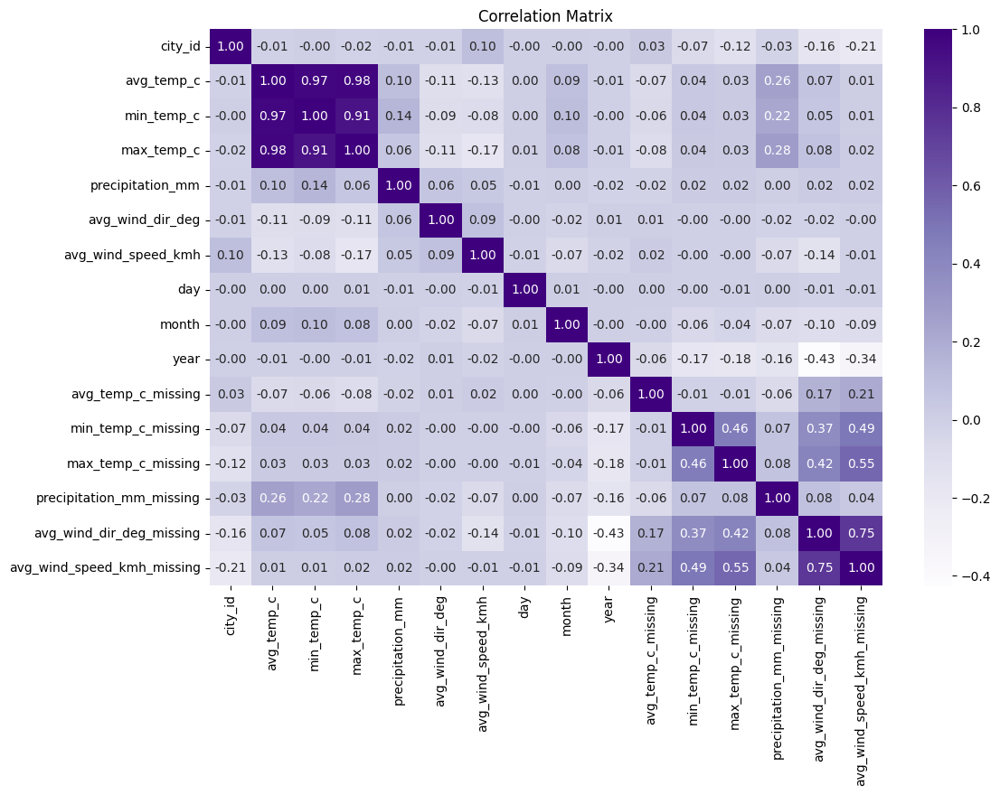

In [104]:
# plotting the correleation analysis of the data using heatmaps
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Purples', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [105]:
# calculate the absolute correlation values with the target variable
correlation_with_target = correlation_matrix['avg_temp_c'].abs()

# sort the correlation values in descending order and select the top features
top_features = correlation_with_target.sort_values(ascending=False)[1:16]

print(top_features)

max_temp_c                    0.976869
min_temp_c                    0.971122
precipitation_mm_missing      0.257122
avg_wind_speed_kmh            0.127121
avg_wind_dir_deg              0.105524
precipitation_mm              0.098048
month                         0.092352
avg_temp_c_missing            0.073514
avg_wind_dir_deg_missing      0.067991
min_temp_c_missing            0.038579
max_temp_c_missing            0.029222
avg_wind_speed_kmh_missing    0.013493
city_id                       0.011335
year                          0.005186
day                           0.004770
Name: avg_temp_c, dtype: float64


In [106]:
## building and training the model

# importing the libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers import Dense
from tensorflow.keras.layers import Dropout, BatchNormalization

In [107]:
# prepare the dataset with the selected features
features = ['max_temp_c', 'min_temp_c', 'avg_wind_speed_kmh', 'avg_wind_dir_deg', 'precipitation_mm', 'city_id', 'month', 'year', 'day']

X = weather[features]
y = weather['avg_temp_c']

# split the dataset into training and test tests
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# normalize the data
scaler = StandardScaler()
X_train_split = scaler.fit_transform(X_train)
X_test_split = scaler.transform(X_test)

y_train_split = y_train
y_test_split = y_test

#building the model
model = Sequential()
model.add(Dense(64, input_dim=X_train_split.shape[1], activation='relu'))
model.add(BatchNormalization())
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dense(1, activation='linear'))

# compile the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mean_absolute_error'])

# train the model
history = model.fit(X_train_split, y_train_split, epochs=100, batch_size=32, validation_split=0.2, verbose=1)

# evaluate the model
loss, mae = model.evaluate(X_test_split, y_test_split, verbose=1)
print(f'Test Mean Absolute Error: {mae}')

Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



3191/3191 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - loss: 77.5092 - mean_absolute_error: 5.7730 - val_loss: 1.5097 - val_mean_absolute_error: 0.9372
Epoch 2/100
3191/3191 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 4.6698 - mean_absolute_error: 1.6925 - val_loss: 1.1787 - val_mean_absolute_error: 0.8095
Epoch 3/100
3191/3191 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 4.5445 - mean_absolute_error: 1.6765 - val_loss: 0.9577 - val_mean_absolute_error: 0.7083
Epoch 4/100
3191/3191 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 4.0877 - mean_absolute_error: 1.5981 - val_loss: 1.1228 - val_mean_absolute_error: 0.7902
Epoch 5/100
3191/3191 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 4.1764 - mean_absolute_error: 1.6042 - val_loss: 0.8640 - val_mean_absolute_error: 0.6745
Epoch 6/100
3191/3191 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 4.0356 - mean_absolute_error: 1.5878 - val_loss: 1.1734 - val_mean_absolute_error: 0.8333
Epoch 7/100
3191/3191 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 4.0538 - mean_absolute_error:

In [108]:
# plotting the validation loss with Plotly
import plotly.express as px

fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(len(history.history['val_loss']))), 
                         y=history.history['val_loss'], 
                         mode='lines', 
                         name='Validation Loss'))
fig.add_trace(go.Scatter(x=list(range(len(history.history['loss']))), 
                         y=history.history['loss'], 
                         mode='lines', 
                         name='Training Loss'))
fig.update_layout(title='Model Loss Over Epochs',
                  xaxis_title='Epochs',
                  yaxis_title='Loss')
fig.show()


In [109]:
# make predictions
y_pred = model.predict(X_test_split)

# create a DataFrame to compare predictions with actual values
comparison_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred.flatten(), 'Error': (y_test - y_pred.flatten()).abs()})

# print the comparison DataFrame
print(comparison_df[:50])

1710/1710 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
        Actual  Predicted     Error
61694     10.7  11.004787  0.304787
161685    27.0  28.860579  1.860579
98940     24.9  25.312883  0.412883
154717    -1.1   1.948384  3.048384
79508     25.6  26.286274  0.686274
73304      1.5   3.276051  1.776051
143405    27.2  27.055883  0.144117
59714     27.5  27.622339  0.122339
127693    27.5  27.497236  0.002764
6456      18.6  18.497120  0.102880
93419     25.9  26.001162  0.101162
135626    13.9  13.813868  0.086132
173189    11.7  12.775295  1.075295
63060     27.9  28.612986  0.712986
112443    13.7  15.153793  1.453793
47138     26.2  26.327625  0.127625
94184     21.5  21.777594  0.277594
49225     -2.6  -1.429870  1.170130
67620     36.6  36.496605  0.103395
42613     25.9  26.955622  1.055622
170838    34.2  34.527603  0.327603
63032     28.3  28.389273  0.089273
140870     9.1   9.283005  0.183005
76388     30.0  31.303429  1.303429
175489     7.1   6.708835  0.391165
69243     16.3  17.49

**Predicting the target on the new dataset**

In [110]:
# importing the new dataset
new_df = pd.read_csv('/kaggle/input/predicta-1-0-predict-the-unpredictable/submission_key.csv')

# converting the date columns to datetime
new_df['date'] = pd.to_datetime(new_df['date'])

new_df['day'] = new_df['date'].dt.day
new_df['month'] = new_df['date'].dt.month
new_df['year'] = new_df['date'].dt.year

new_df = new_df.drop('date', axis=1)

# encoding the categorical variables

# # converts the city_id column from the weatherDataFrame into a dictionary with city IDs as keys and their counts as values.
# new_df_freqency_map = new_df.city_id.value_counts().to_dict()
# new_df_freqency_map

# frequency encoding
# replacing the city IDs with their frequency
# new_df.city_id = new_df.city_id.map(new_df_freqency_map)
new_df.city_id = new_df.city_id.map(weather_df_freqency_map)
new_df[:10]

,submission_ID,city_id,day,month,year
0,1,1826,1,1,2019
1,2,1826,2,1,2019
2,3,1826,3,1,2019
3,4,1826,4,1,2019
4,5,1826,5,1,2019
5,6,1826,6,1,2019
6,7,1826,7,1,2019
7,8,1803,1,1,2019
8,9,1803,2,1,2019
9,10,1803,3,1,2019


In [111]:
# #predicting the target
# #list of all features used in the original training
# # original_features = ['city_id', 'min_temp_c', 'max_temp_c',
# #                      'precipitation_mm', 'avg_wind_dir_deg', 
# #                      'avg_wind_speed_kmh', 'day', 'month', 
# #                      'year', 'min_temp_c_missing', 'max_temp_c_missing', 
# #                      'precipitation_mm_missing', 'avg_wind_dir_deg_missing',
# #                      'avg_wind_speed_kmh_missing']

        
# # compute the mean or median of the features
# imputation_values = X_train.mean() 

# print(imputation_values[:5])

# #list of all features used in the original training
# original_features = ['max_temp_c', 'min_temp_c', 'avg_wind_speed_kmh', 'avg_wind_dir_deg', 'precipitation_mm', 'city_id', 'month', 'year', 'day']

# # features available in the new dataset
# new_features = ['city_id', 'day', 'month', 'year']

# # add missing features with default values (zeros) to the new dataset
# for feature in original_features:
#     if feature not in new_features:
#         new_df[feature] = imputation_values[feature]
        
# print(new_df[:5])
    
# # ensuring the columns are in the same order as the original training set
# new_df = new_df[original_features]

# # transform the new dataset using the previously fitted scaler
# X_new = scaler.transform(new_df)

# # make predictions
# new_predictions = model.predict(X_new)

# # display the first 10 predictions
# new_predictions[:10]

In [112]:
# # compute the mean or median of the features
# imputation_values = X_train.mean() 

# print(imputation_values[:5])

# #list of all features used in the original training
# original_features = ['max_temp_c', 'min_temp_c', 'avg_wind_speed_kmh', 'avg_wind_dir_deg', 'precipitation_mm', 'city_id', 'month', 'year', 'day']

# # features available in the new dataset
# new_features = ['city_id', 'day', 'month', 'year']

# # add missing features with default values (zeros) to the new dataset
# for feature in original_features:
#     if feature not in new_features:
#         new_df[feature] = imputation_values[feature]
        
# print(new_df[:5])
    
# # ensuring the columns are in the same order as the original training set
# new_df = new_df[original_features]

# # transform the new dataset using the previously fitted scaler
# X_new = scaler.transform(new_df)

# # make predictions
# new_predictions = model.predict(X_new)

# # display the first 10 predictions
# new_predictions[:10]

In [114]:
# list of all features used in the original training
original_features = ['max_temp_c', 'min_temp_c', 'avg_wind_speed_kmh', 'avg_wind_dir_deg', 'precipitation_mm', 'city_id', 'month', 'year', 'day']

# list of features to be skipped
skip_features = ['city_id', 'day', 'month', 'year']

# calculate mean for each month for one city for the features excluding city_id, day, month, and year
mean_values = X_train.groupby(['city_id','month']).mean().reset_index()

# merge only the relevant columns to avoid replacing 'year', 'day', etc.
new_df = pd.merge(new_df, mean_values, on=['city_id', 'month'], how='left', suffixes=('', '_mean'))

# ensure only non-skip features are filled
for feature in original_features:
    if feature not in skip_features:
        new_df[feature] = new_df[feature].fillna(new_df[f'{feature}_mean'])
        new_df.drop(columns=[f'{feature}_mean'], inplace=True)

# ensuring the columns are in the same order as the original training set
new_df = new_df[original_features]

print(new_df[:50])

# transform the new dataset using the previously fitted scaler
X_new = scaler.transform(new_df)

# make predictions
new_predictions = model.predict(X_new)

# display the first 10 predictions
print(new_predictions[:10])

    max_temp_c  min_temp_c  avg_wind_speed_kmh  avg_wind_dir_deg  \
0    17.065194    8.536996           11.962800        175.108519   
1    17.065194    8.536996           11.962800        175.108519   
2    17.065194    8.536996           11.962800        175.108519   
3    17.065194    8.536996           11.962800        175.108519   
4    17.065194    8.536996           11.962800        175.108519   
5    17.065194    8.536996           11.962800        175.108519   
6    17.065194    8.536996           11.962800        175.108519   
7    17.183801   11.700765           11.406686        194.314769   
8    17.183801   11.700765           11.406686        194.314769   
9    17.183801   11.700765           11.406686        194.314769   
10   17.183801   11.700765           11.406686        194.314769   
11   17.183801   11.700765           11.406686        194.314769   
12   17.183801   11.700765           11.406686        194.314769   
13   17.183801   11.700765           11.406686  

In [115]:
# read the submission key file
submission_key = pd.read_csv('/kaggle/input/predicta-1-0-predict-the-unpredictable/submission_key.csv')

# add the sold_qty column with the rounded predictions
submission_key['avg_temp_c'] = new_predictions

# select only the ID and sold_qty columns
submission_key_final = submission_key[['submission_ID', 'avg_temp_c']]
print(submission_key_final[:20])

# save to a new CSV file
submission_key_final.to_csv('submission_avg_temp_predictions.csv', index=False)

# display the saved file for download
from IPython.display import FileLink

# provide a link to download the file
FileLink('submission_avg_temp_predictions.csv')

    submission_ID  avg_temp_c
0               1   13.010483
1               2   13.005299
2               3   12.999868
3               4   12.992853
4               5   12.985837
5               6   12.980797
6               7   12.979070
7               8   15.169340
8               9   15.165904
9              10   15.161772
10             11   15.157637
11             12   15.153504
12             13   15.147087
13             14   15.139599
14             15    7.706167
15             16    7.707125
16             17    7.708272
17             18    7.709500
18             19    7.709306
19             20    7.709702


/kaggle/working/submission_avg_temp_predictions.csv